In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  
)
from models.nnunet import nnUnet
from models.memory_unet import MemoryUnet
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [2]:
args = {
    "base_path" : "./dataset/syntax/",
    "memory_unet":{
        "layer_count":4,
        "channel_max":256,
        "downsampling":"maxpool",
        "dropout" : False,
        "normaliztion":"InstanceNorm2d",#InstanceNorm2d
        "activation" : "LeakyReLU",
        "first_layer_out_c" : 32,
        "deep_super_vision":True
    },
    "image_shape" : (448,448),
    "in_c":1,
    
    "training_mode":"binary",
    "report_class_wise":True,
    "attention" : False,
    "batch_size" : 8,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":50,
    "f_int_scale" : 2,
    "full_report_cycle" : 10,
    "max_channels":512,
    "loss_type":"tversky",
    "output_base_path" : "./outputs",
    "name" : "binary-tests-dsv",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    ### Loss Functions
    "mask_ce_conf":{
        "imp_coef":1.0
    },
    "focal_ce_conf":{
        "gamma":2.0,
        "loss_scale":1.0,
        "imp_coef":1.0
    },
    "tversky_conf":{
        "alpha":0.9,
        "beta":0.1,
        "gamma":2.00,
        "weights":None,
        "imp_coef":1.0
    },
    "cl_dice_conf":{
        "imp_coef":1.0,
        "k":40
    },
    ### Optimizers
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
if(args["training_mode"] == "binary"):
    args["class_count"] = 2 
    class_map = {
        1:"fg"
    }

else:
    args["class_count"] = 26
    class_map = {
        1: '1',2: '2', 3: '3',4: '4',
        5: '5',6: '6',7:'9',8:'7',9:'9a',
        10:'10',11:'8',12:'10a',13:'12',14:'11',
        15:'12a',16:'12b',17:'13',18:'14',19:'14a',
        20:'14b',21:'15',22:'16',
        23: '16a',24: '16b',25: '16c',
    }

# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","mask CE-Loss",args["loss_type"],"cl dice loss"]
if(args["memory_unet"]["deep_super_vision"]):
    shape = args["image_shape"]
    loss_weights = [1/(2**i) for i in range(1,args["layer_count"])]
else:
    loss_weights = []
loss_weights



[0.5, 0.25, 0.125, 0.0625]

In [3]:
if(args["training_mode"]!="binary"):
    b=0.999

    train_class_counts = [
        1200,374,375,369,303,525,537,
        198,340,70,21,310,1,61,320,129,
        63,305,107,49,127,38,232,43,48,31
    ]

    total = np.sum(train_class_counts)
    mask_ce_weights = np.log(total/np.array(train_class_counts))
    mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
    mask_ce_weights[0]=0.1

    args["mask_ce_weights"]=mask_ce_weights
    args["mask_ce_weights"]
else:
    args["mask_ce_weights"]=[0.1,1]

In [4]:
# args["t_alpha"] = [1,0.8]
args["tversky_conf"]["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    ]  
)

if(args["in_c"]==1):
    normalizer = normalize_xca
else:
    normalizer = A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
        max_pixel_value=255.0,
    )
train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:50: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:63: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(
    transform = train_transforms,
    data = train_images , 
    normalizer = normalizer,
    example_phase=False
)
valid_ds = TrainUnetDataset(
    transform = test_transforms,
    data = valid_images,
    normalizer = normalizer,
    example_phase=False
)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True,

    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False,

)


In [8]:

# model = nnUnet(args).to(args["device"])
model = MemoryUnet(args).to(args["device"])

loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(
#     model.parameters(), 
#     **args["adam_conf"]
# )
optimizer = torch.optim.SGD(
    model.parameters(),
    **args["sgd_conf"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model


encoder info : 
[1, 32, 64, 128, 256]
-----------------------
loss is set to tversky


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (0)
total loss : 1.9077260046005249 - mask CE-Loss : 0.5770790450572968 - tversky : 0.5858376204967499
cl dice loss : 0.7448093271255494 - 
train avg metrics for epoch 0 :
avg dice : 0.4551067054271698 - avg precision : 0.3618633449077606 - avg recall : 0.6130833625793457
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 0.9252939081192016 - mask CE-Loss : 0.3665269500017166 - tversky : 0.192048077583313
cl dice loss : 0.3667188835144043 - 
valid avg metrics for epoch 0 :
avg dice : 0.6291398406028748 - avg precision : 0.6198148131370544 - avg recall : 0.6387497186660767
------------------------------------------------------------
New Best! : dice = 0.6291398406028748


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.2413, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (1)
total loss : 1.3841390323638916 - mask CE-Loss : 0.4753844027519226 - tversky : 0.3543868931531906
cl dice loss : 0.5543677332401276 - 
train avg metrics for epoch 1 :
avg dice : 0.6113862991333008 - avg precision : 0.5502381920814514 - avg recall : 0.6878244876861572
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 0.852799437046051 - mask CE-Loss : 0.3172029584646225 - tversky : 0.19450340986251832
cl dice loss : 0.3410930633544922 - 
valid avg metrics for epoch 1 :
avg dice : 0.6550136208534241 - avg precision : 0.6030341386795044 - avg recall : 0.716799259185791
------------------------------------------------------------
New Best! : dice = 0.6550136208534241


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (2)
total loss : 1.2719126319885254 - mask CE-Loss : 0.43670186161994934 - tversky : 0.3167204439640045
cl dice loss : 0.5184903264045715 - 
train avg metrics for epoch 2 :
avg dice : 0.6364970207214355 - avg precision : 0.574438750743866 - avg recall : 0.7135880589485168
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 0.78511549949646 - mask CE-Loss : 0.2832115989923477 - tversky : 0.17552497029304504
cl dice loss : 0.32637892484664915 - 
valid avg metrics for epoch 2 :
avg dice : 0.6751874089241028 - avg precision : 0.6356685161590576 - avg recall : 0.7199457883834839
------------------------------------------------------------
New Best! : dice = 0.6751874089241028


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (3)
total loss : 1.2015835762023925 - mask CE-Loss : 0.4044642629623413 - tversky : 0.2972847602367401
cl dice loss : 0.4998345522880554 - 
train avg metrics for epoch 3 :
avg dice : 0.6501070857048035 - avg precision : 0.5872459411621094 - avg recall : 0.7280392646789551
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 0.7535723853111267 - mask CE-Loss : 0.23255173802375795 - tversky : 0.20398914337158203
cl dice loss : 0.31703150510787964 - 
valid avg metrics for epoch 3 :
avg dice : 0.6762339472770691 - avg precision : 0.5900508761405945 - avg recall : 0.7918990254402161
------------------------------------------------------------
New Best! : dice = 0.6762339472770691


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (4)
total loss : 1.188515067100525 - mask CE-Loss : 0.40549654233455656 - tversky : 0.2911977682709694
cl dice loss : 0.4918207669258118 - 
train avg metrics for epoch 4 :
avg dice : 0.6567420959472656 - avg precision : 0.5951599478721619 - avg recall : 0.7325391173362732
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 0.7567837929725647 - mask CE-Loss : 0.2577041304111481 - tversky : 0.18620394945144653
cl dice loss : 0.3128757166862488 - 
valid avg metrics for epoch 4 :
avg dice : 0.6825553774833679 - avg precision : 0.6018980741500854 - avg recall : 0.7881746888160706
------------------------------------------------------------
New Best! : dice = 0.6825553774833679


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (5)
total loss : 1.1516437864303588 - mask CE-Loss : 0.3944802939891815 - tversky : 0.27690401196479797
cl dice loss : 0.4802594819068909 - 
train avg metrics for epoch 5 :
avg dice : 0.6650274395942688 - avg precision : 0.6042417883872986 - avg recall : 0.7394108772277832
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 0.7453317022323609 - mask CE-Loss : 0.2721525239944458 - tversky : 0.16717725962400437
cl dice loss : 0.3060019135475159 - 
valid avg metrics for epoch 5 :
avg dice : 0.6891615390777588 - avg precision : 0.6258462071418762 - avg recall : 0.7667297124862671
------------------------------------------------------------
New Best! : dice = 0.6891615390777588


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (6)
total loss : 1.1329829235076905 - mask CE-Loss : 0.39053500497341154 - tversky : 0.2686252152919769
cl dice loss : 0.4738227002620697 - 
train avg metrics for epoch 6 :
avg dice : 0.6720497608184814 - avg precision : 0.6136159896850586 - avg recall : 0.7427840232849121
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 0.7112449264526367 - mask CE-Loss : 0.2173444414138794 - tversky : 0.17787259846925735
cl dice loss : 0.3160278797149658 - 
valid avg metrics for epoch 6 :
avg dice : 0.7045078277587891 - avg precision : 0.6666244864463806 - avg recall : 0.7469564080238342
------------------------------------------------------------
New Best! : dice = 0.7045078277587891


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (7)
total loss : 1.120086235523224 - mask CE-Loss : 0.3776547392606735 - tversky : 0.2687800943851471
cl dice loss : 0.47365140199661254 - 
train avg metrics for epoch 7 :
avg dice : 0.6744332909584045 - avg precision : 0.615665078163147 - avg recall : 0.7456048727035522
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 0.68686115026474 - mask CE-Loss : 0.25331659078598023 - tversky : 0.14870977997779847
cl dice loss : 0.2848347806930542 - 
valid avg metrics for epoch 7 :
avg dice : 0.7081671357154846 - avg precision : 0.6489258408546448 - avg recall : 0.7793115973472595
------------------------------------------------------------
New Best! : dice = 0.7081671357154846


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (8)
total loss : 1.091666425704956 - mask CE-Loss : 0.37375626039505006 - tversky : 0.25345686042308807
cl dice loss : 0.4644533052444458 - 
train avg metrics for epoch 8 :
avg dice : 0.6808556914329529 - avg precision : 0.624168336391449 - avg recall : 0.748868465423584
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 0.6492466926574707 - mask CE-Loss : 0.23318033576011657 - tversky : 0.1300122344493866
cl dice loss : 0.2860541296005249 - 
valid avg metrics for epoch 8 :
avg dice : 0.7268375158309937 - avg precision : 0.6935698390007019 - avg recall : 0.7634573578834534
------------------------------------------------------------
New Best! : dice = 0.7268375158309937


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (9)
total loss : 1.061120605945587 - mask CE-Loss : 0.3580011022090912 - tversky : 0.2506601139307022
cl dice loss : 0.45245939373970034 - 
train avg metrics for epoch 9 :
avg dice : 0.686074435710907 - avg precision : 0.6276610493659973 - avg recall : 0.7564759850502014
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 0.6566894817352295 - mask CE-Loss : 0.23953266859054564 - tversky : 0.13247989624738693
cl dice loss : 0.2846769165992737 - 
valid avg metrics for epoch 9 :
avg dice : 0.7205117344856262 - avg precision : 0.6931173801422119 - avg recall : 0.7501606345176697
fg => dice : 0.7205117344856262 p : 0.6931173801422119 , r : 0.7501606345176697
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (10)
total loss : 1.0464060401916504 - mask CE-Loss : 0.3519942420721054 - tversky : 0.24153290665149688
cl dice loss : 0.4528788890838623 - 
train avg metrics for epoch 10 :
avg dice : 0.6916807293891907 - avg precision : 0.638346791267395 - avg recall : 0.7547392249107361
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (10)
total loss : 0.6565946340560913 - mask CE-Loss : 0.24047794461250305 - tversky : 0.12984104037284852
cl dice loss : 0.286275646686554 - 
valid avg metrics for epoch 10 :
avg dice : 0.7250782251358032 - avg precision : 0.7059434652328491 - avg recall : 0.7452791929244995
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (11)
total loss : 1.0284641823768617 - mask CE-Loss : 0.3460454264879227 - tversky : 0.23864966529607773
cl dice loss : 0.4437690954208374 - 
train avg metrics for epoch 11 :
avg dice : 0.6947771906852722 - avg precision : 0.6379380822181702 - avg recall : 0.7627354264259338
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (11)
total loss : 0.6635075426101684 - mask CE-Loss : 0.27934828579425813 - tversky : 0.10900262802839279
cl dice loss : 0.2751566290855408 - 
valid avg metrics for epoch 11 :
avg dice : 0.7280237078666687 - avg precision : 0.7192308306694031 - avg recall : 0.737034261226654
------------------------------------------------------------
New Best! : dice = 0.7280237078666687


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (12)
total loss : 1.014443141937256 - mask CE-Loss : 0.34251338028907774 - tversky : 0.23061986207962037
cl dice loss : 0.4413099012374878 - 
train avg metrics for epoch 12 :
avg dice : 0.6981829404830933 - avg precision : 0.643509030342102 - avg recall : 0.7630099654197693
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (12)
total loss : 0.6109479367733002 - mask CE-Loss : 0.1968909329175949 - tversky : 0.14236960649490357
cl dice loss : 0.27168739557266236 - 
valid avg metrics for epoch 12 :
avg dice : 0.7400034070014954 - avg precision : 0.6971374750137329 - avg recall : 0.7884861826896667
------------------------------------------------------------
New Best! : dice = 0.7400034070014954


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (13)
total loss : 0.9782025408744812 - mask CE-Loss : 0.32749665415287016 - tversky : 0.22211176693439483
cl dice loss : 0.4285941135883331 - 
train avg metrics for epoch 13 :
avg dice : 0.7046114206314087 - avg precision : 0.6498149633407593 - avg recall : 0.7695004940032959
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (13)
total loss : 0.6185456132888794 - mask CE-Loss : 0.24606987118721008 - tversky : 0.10549881160259247
cl dice loss : 0.2669769287109375 - 
valid avg metrics for epoch 13 :
avg dice : 0.7387460470199585 - avg precision : 0.7351956367492676 - avg recall : 0.7423308491706848
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (14)
total loss : 0.9678497042655945 - mask CE-Loss : 0.32285839998722077 - tversky : 0.22375723683834076
cl dice loss : 0.421234063744545 - 
train avg metrics for epoch 14 :
avg dice : 0.7058157920837402 - avg precision : 0.6473037004470825 - avg recall : 0.7759573459625244
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (14)
total loss : 0.6157863938808441 - mask CE-Loss : 0.2558162879943848 - tversky : 0.10263838469982148
cl dice loss : 0.2573317217826843 - 
valid avg metrics for epoch 14 :
avg dice : 0.7389466166496277 - avg precision : 0.7189199328422546 - avg recall : 0.7601209878921509
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (15)
total loss : 0.9574692459106445 - mask CE-Loss : 0.3275252796411514 - tversky : 0.21228643995523452
cl dice loss : 0.4176575343608856 - 
train avg metrics for epoch 15 :
avg dice : 0.7110697627067566 - avg precision : 0.6608601808547974 - avg recall : 0.7695361375808716
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (15)
total loss : 0.6158081662654876 - mask CE-Loss : 0.22719887495040894 - tversky : 0.12343603968620301
cl dice loss : 0.2651732540130615 - 
valid avg metrics for epoch 15 :
avg dice : 0.7332414388656616 - avg precision : 0.6969133615493774 - avg recall : 0.7735651135444641
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (16)
total loss : 0.9483723697662354 - mask CE-Loss : 0.3252627170085907 - tversky : 0.20918089938163759
cl dice loss : 0.41392875647544863 - 
train avg metrics for epoch 16 :
avg dice : 0.7136322259902954 - avg precision : 0.6623759865760803 - avg recall : 0.7734864354133606
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (16)
total loss : 0.6255829107761383 - mask CE-Loss : 0.23969701528549195 - tversky : 0.11033235132694244
cl dice loss : 0.2755535459518433 - 
valid avg metrics for epoch 16 :
avg dice : 0.7342961430549622 - avg precision : 0.7408770322799683 - avg recall : 0.7278311848640442
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (17)
total loss : 0.9395276098251343 - mask CE-Loss : 0.31690650594234465 - tversky : 0.21088346052169799
cl dice loss : 0.4117376470565796 - 
train avg metrics for epoch 17 :
avg dice : 0.7114474177360535 - avg precision : 0.6578372120857239 - avg recall : 0.7745708227157593
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (17)
total loss : 0.588572598695755 - mask CE-Loss : 0.20414652049541473 - tversky : 0.12857067435979844
cl dice loss : 0.2558554077148438 - 
valid avg metrics for epoch 17 :
avg dice : 0.735132098197937 - avg precision : 0.6853027939796448 - avg recall : 0.7927758693695068
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (18)
total loss : 0.9125361728668213 - mask CE-Loss : 0.3068250054121017 - tversky : 0.20474239200353622
cl dice loss : 0.4009687752723694 - 
train avg metrics for epoch 18 :
avg dice : 0.7193516492843628 - avg precision : 0.661174476146698 - avg recall : 0.7887546420097351
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (18)
total loss : 0.5744878602027893 - mask CE-Loss : 0.1997350350022316 - tversky : 0.12952990651130677
cl dice loss : 0.24522291660308837 - 
valid avg metrics for epoch 18 :
avg dice : 0.7376412153244019 - avg precision : 0.6718725562095642 - avg recall : 0.8176830410957336
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (19)
total loss : 0.9268823003768921 - mask CE-Loss : 0.3144084790945053 - tversky : 0.20765368676185608
cl dice loss : 0.40482014083862305 - 
train avg metrics for epoch 19 :
avg dice : 0.7158254384994507 - avg precision : 0.6605167388916016 - avg recall : 0.7812431454658508
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (19)
total loss : 0.5878190648555756 - mask CE-Loss : 0.20057636976242066 - tversky : 0.12766890943050385
cl dice loss : 0.25957379341125486 - 
valid avg metrics for epoch 19 :
avg dice : 0.7419537901878357 - avg precision : 0.7038626074790955 - avg recall : 0.7844037413597107
fg => dice : 0.7419537901878357 p : 0.7038626074790955 , r : 0.7844037413597107
------------------------------------------------------------
New Best! : dice = 0.7419537901878357


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.4489, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (20)
total loss : 0.9357878527641297 - mask CE-Loss : 0.32142856872081754 - tversky : 0.20840248399972916
cl dice loss : 0.4059567987918854 - 
train avg metrics for epoch 20 :
avg dice : 0.7158840894699097 - avg precision : 0.6624412536621094 - avg recall : 0.7787067294120789
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (20)
total loss : 0.6072455430030823 - mask CE-Loss : 0.2178818851709366 - tversky : 0.12564808398485183
cl dice loss : 0.26371557474136353 - 
valid avg metrics for epoch 20 :
avg dice : 0.7381020784378052 - avg precision : 0.7032045125961304 - avg recall : 0.7766441702842712
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (21)
total loss : 0.9311929893493652 - mask CE-Loss : 0.3187105876207352 - tversky : 0.2081179042458534
cl dice loss : 0.4043645040988922 - 
train avg metrics for epoch 21 :
avg dice : 0.7160428166389465 - avg precision : 0.6614566445350647 - avg recall : 0.7804486155509949
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (21)
total loss : 0.5803768253326416 - mask CE-Loss : 0.21446087896823884 - tversky : 0.11366070508956909
cl dice loss : 0.2522552466392517 - 
valid avg metrics for epoch 21 :
avg dice : 0.7470258474349976 - avg precision : 0.7101907134056091 - avg recall : 0.7878909707069397
------------------------------------------------------------
New Best! : dice = 0.7470258474349976


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (22)
total loss : 0.899577702999115 - mask CE-Loss : 0.3054640283584595 - tversky : 0.20194155412912368
cl dice loss : 0.3921721200942993 - 
train avg metrics for epoch 22 :
avg dice : 0.7223612070083618 - avg precision : 0.6680179834365845 - avg recall : 0.7863290309906006
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (22)
total loss : 0.5783193016052246 - mask CE-Loss : 0.24772347927093505 - tversky : 0.08606288060545922
cl dice loss : 0.24453294038772583 - 
valid avg metrics for epoch 22 :
avg dice : 0.7546773552894592 - avg precision : 0.7637853622436523 - avg recall : 0.7457840442657471
------------------------------------------------------------
New Best! : dice = 0.7546773552894592


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (23)
total loss : 0.8834392077922821 - mask CE-Loss : 0.3011591440439224 - tversky : 0.19646493101119994
cl dice loss : 0.38581513249874116 - 
train avg metrics for epoch 23 :
avg dice : 0.7255825400352478 - avg precision : 0.6717279553413391 - avg recall : 0.7888252139091492
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (23)
total loss : 0.5907593286037445 - mask CE-Loss : 0.23351758003234863 - tversky : 0.1054417772591114
cl dice loss : 0.25179996728897097 - 
valid avg metrics for epoch 23 :
avg dice : 0.7424885034561157 - avg precision : 0.7168196439743042 - avg recall : 0.7700639963150024
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (24)
total loss : 0.8897504277229309 - mask CE-Loss : 0.29967389523983 - tversky : 0.19838139081001283
cl dice loss : 0.39169514513015746 - 
train avg metrics for epoch 24 :
avg dice : 0.7238749265670776 - avg precision : 0.6672659516334534 - avg recall : 0.7909794449806213
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (24)
total loss : 0.5665201258659363 - mask CE-Loss : 0.23040754675865174 - tversky : 0.09060987338423729
cl dice loss : 0.24550270557403564 - 
valid avg metrics for epoch 24 :
avg dice : 0.7573917508125305 - avg precision : 0.7679779529571533 - avg recall : 0.7470933794975281
------------------------------------------------------------
New Best! : dice = 0.7573917508125305


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (25)
total loss : 0.8695815505981446 - mask CE-Loss : 0.2967870799303055 - tversky : 0.19246442806720734
cl dice loss : 0.3803300392627716 - 
train avg metrics for epoch 25 :
avg dice : 0.7295286059379578 - avg precision : 0.6746446490287781 - avg recall : 0.7941332459449768
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (25)
total loss : 0.5947258222103119 - mask CE-Loss : 0.25474461436271667 - tversky : 0.09219016209244728
cl dice loss : 0.24779104709625244 - 
valid avg metrics for epoch 25 :
avg dice : 0.7494126558303833 - avg precision : 0.7525563836097717 - avg recall : 0.7462950944900513
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (26)
total loss : 0.8980085096359253 - mask CE-Loss : 0.3082716726064682 - tversky : 0.1989019277691841
cl dice loss : 0.39083491325378417 - 
train avg metrics for epoch 26 :
avg dice : 0.7228857278823853 - avg precision : 0.6693785786628723 - avg recall : 0.7856903076171875
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (26)
total loss : 0.5886717176437378 - mask CE-Loss : 0.2118598484992981 - tversky : 0.12302054554224014
cl dice loss : 0.25379132986068725 - 
valid avg metrics for epoch 26 :
avg dice : 0.734880268573761 - avg precision : 0.7002238631248474 - avg recall : 0.7731457948684692
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.3469, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (27)
total loss : 0.8857133412361144 - mask CE-Loss : 0.29920831656455993 - tversky : 0.19924480134248734
cl dice loss : 0.3872602224349976 - 
train avg metrics for epoch 27 :
avg dice : 0.7239523530006409 - avg precision : 0.665665864944458 - avg recall : 0.7934256792068481
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (27)
total loss : 0.5477911245822906 - mask CE-Loss : 0.1932236909866333 - tversky : 0.11567004710435867
cl dice loss : 0.2388973903656006 - 
valid avg metrics for epoch 27 :
avg dice : 0.7525745034217834 - avg precision : 0.7087771892547607 - avg recall : 0.802141010761261
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (28)
total loss : 0.877790399312973 - mask CE-Loss : 0.29856071770191195 - tversky : 0.1975858197212219
cl dice loss : 0.38164386415481566 - 
train avg metrics for epoch 28 :
avg dice : 0.7254130840301514 - avg precision : 0.6692987680435181 - avg recall : 0.7917977571487427
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (28)
total loss : 0.5383243453502655 - mask CE-Loss : 0.19392446160316468 - tversky : 0.11082427740097046
cl dice loss : 0.23357560873031616 - 
valid avg metrics for epoch 28 :
avg dice : 0.7559842467308044 - avg precision : 0.7099282145500183 - avg recall : 0.808430552482605
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (29)
total loss : 0.8869928085803985 - mask CE-Loss : 0.30455902028083803 - tversky : 0.19520843452215195
cl dice loss : 0.38722535145282744 - 
train avg metrics for epoch 29 :
avg dice : 0.7256964445114136 - avg precision : 0.6743672490119934 - avg recall : 0.7854831218719482
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (29)
total loss : 0.5491047811508178 - mask CE-Loss : 0.23178439497947692 - tversky : 0.08757530137896538
cl dice loss : 0.2297450876235962 - 
valid avg metrics for epoch 29 :
avg dice : 0.7599486708641052 - avg precision : 0.7530396580696106 - avg recall : 0.7669855952262878
fg => dice : 0.7599486708641052 p : 0.7530396580696106 , r : 0.7669855952262878
------------------------------------------------------------
New Best! : dice = 0.7599486708641052


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (30)
total loss : 0.8763483541011811 - mask CE-Loss : 0.29645042824745177 - tversky : 0.19754278129339217
cl dice loss : 0.38235514998435977 - 
train avg metrics for epoch 30 :
avg dice : 0.7257885932922363 - avg precision : 0.6692314743995667 - avg recall : 0.7927875518798828
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (30)
total loss : 0.5661765277385712 - mask CE-Loss : 0.2390999811887741 - tversky : 0.0876451325416565
cl dice loss : 0.23943141460418702 - 
valid avg metrics for epoch 30 :
avg dice : 0.7535275220870972 - avg precision : 0.7526665329933167 - avg recall : 0.7543905377388
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (31)
total loss : 0.8692954235076904 - mask CE-Loss : 0.29761432778835295 - tversky : 0.1915700952410698
cl dice loss : 0.38011099529266357 - 
train avg metrics for epoch 31 :
avg dice : 0.7297266125679016 - avg precision : 0.6776524782180786 - avg recall : 0.7904701828956604
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (31)
total loss : 0.5324611592292786 - mask CE-Loss : 0.21313855469226836 - tversky : 0.08954999879002572
cl dice loss : 0.2297726035118103 - 
valid avg metrics for epoch 31 :
avg dice : 0.7631582617759705 - avg precision : 0.7481730580329895 - avg recall : 0.7787560224533081
------------------------------------------------------------
New Best! : dice = 0.7631582617759705


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.3516, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (32)
total loss : 0.8786115221977234 - mask CE-Loss : 0.3029739574193954 - tversky : 0.191463292658329
cl dice loss : 0.384174271941185 - 
train avg metrics for epoch 32 :
avg dice : 0.728696882724762 - avg precision : 0.6752102375030518 - avg recall : 0.7913864254951477
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (32)
total loss : 0.5881448209285736 - mask CE-Loss : 0.26725525081157686 - tversky : 0.07621218100190162
cl dice loss : 0.2446773838996887 - 
valid avg metrics for epoch 32 :
avg dice : 0.7533465623855591 - avg precision : 0.77369225025177 - avg recall : 0.734043538570404
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (33)
total loss : 0.8797686419487 - mask CE-Loss : 0.30189407801628115 - tversky : 0.19511283618211747
cl dice loss : 0.3827617311477661 - 
train avg metrics for epoch 33 :
avg dice : 0.7255936861038208 - avg precision : 0.6715231537818909 - avg recall : 0.7891342639923096
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (33)
total loss : 0.542803852558136 - mask CE-Loss : 0.18332236915826797 - tversky : 0.12919629633426666
cl dice loss : 0.23028518676757812 - 
valid avg metrics for epoch 33 :
avg dice : 0.7457011342048645 - avg precision : 0.6830002665519714 - avg recall : 0.821077823638916
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (34)
total loss : 0.8820658674240113 - mask CE-Loss : 0.302819962143898 - tversky : 0.19418175727128983
cl dice loss : 0.38506414771080016 - 
train avg metrics for epoch 34 :
avg dice : 0.7253921627998352 - avg precision : 0.6702975034713745 - avg recall : 0.7903547883033752
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (34)
total loss : 0.5351447474956512 - mask CE-Loss : 0.22216498076915742 - tversky : 0.0929487107694149
cl dice loss : 0.22003105640411377 - 
valid avg metrics for epoch 34 :
avg dice : 0.7608216404914856 - avg precision : 0.7304145693778992 - avg recall : 0.7938703894615173
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (35)
total loss : 0.8520442276000977 - mask CE-Loss : 0.29688625144958497 - tversky : 0.18159043139219283
cl dice loss : 0.3735675463676453 - 
train avg metrics for epoch 35 :
avg dice : 0.7348126173019409 - avg precision : 0.6832442283630371 - avg recall : 0.794800877571106
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (35)
total loss : 0.5264833843708039 - mask CE-Loss : 0.1901644030213356 - tversky : 0.10778888642787933
cl dice loss : 0.22853010177612304 - 
valid avg metrics for epoch 35 :
avg dice : 0.7607982158660889 - avg precision : 0.7243826985359192 - avg recall : 0.8010687828063965
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (36)
total loss : 0.8503605985641479 - mask CE-Loss : 0.2878982855081558 - tversky : 0.18782461702823638
cl dice loss : 0.37463769817352294 - 
train avg metrics for epoch 36 :
avg dice : 0.7321580052375793 - avg precision : 0.6735466122627258 - avg recall : 0.8019422292709351
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (36)
total loss : 0.513735089302063 - mask CE-Loss : 0.19378331452608108 - tversky : 0.10306702047586441
cl dice loss : 0.21688475847244262 - 
valid avg metrics for epoch 36 :
avg dice : 0.7620984315872192 - avg precision : 0.7129814028739929 - avg recall : 0.8184834122657776
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (37)
total loss : 0.8518923892974853 - mask CE-Loss : 0.2950441712141037 - tversky : 0.18469906681776047
cl dice loss : 0.3721491591930389 - 
train avg metrics for epoch 37 :
avg dice : 0.7343763113021851 - avg precision : 0.6875541806221008 - avg recall : 0.7880415916442871
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (37)
total loss : 0.5164417028427124 - mask CE-Loss : 0.209162095785141 - tversky : 0.08797882914543152
cl dice loss : 0.2193007755279541 - 
valid avg metrics for epoch 37 :
avg dice : 0.765075147151947 - avg precision : 0.7537809014320374 - avg recall : 0.7767130136489868
------------------------------------------------------------
New Best! : dice = 0.765075147151947


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (38)
total loss : 0.8518306956291198 - mask CE-Loss : 0.29545576775074006 - tversky : 0.184382626414299
cl dice loss : 0.3719922976493835 - 
train avg metrics for epoch 38 :
avg dice : 0.7332663536071777 - avg precision : 0.6783437728881836 - avg recall : 0.7978662252426147
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (38)
total loss : 0.5284062790870666 - mask CE-Loss : 0.2434532594680786 - tversky : 0.07177804842591286
cl dice loss : 0.2131749725341797 - 
valid avg metrics for epoch 38 :
avg dice : 0.7687633037567139 - avg precision : 0.7675844430923462 - avg recall : 0.7699457406997681
------------------------------------------------------------
New Best! : dice = 0.7687633037567139


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (39)
total loss : 0.8591839785575867 - mask CE-Loss : 0.2934713386297226 - tversky : 0.1908238243460655
cl dice loss : 0.3748888201713562 - 
train avg metrics for epoch 39 :
avg dice : 0.7299973368644714 - avg precision : 0.676030695438385 - avg recall : 0.7933276295661926
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (39)
total loss : 0.5110743796825409 - mask CE-Loss : 0.196759475171566 - tversky : 0.10210128098726273
cl dice loss : 0.21221362113952635 - 
valid avg metrics for epoch 39 :
avg dice : 0.7604014277458191 - avg precision : 0.7192538976669312 - avg recall : 0.8065426349639893
fg => dice : 0.7604014277458191 p : 0.7192538976669312 , r : 0.8065426349639893
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (40)
total loss : 0.8429300589561463 - mask CE-Loss : 0.29590279030799865 - tversky : 0.1835257026553154
cl dice loss : 0.3635015573501587 - 
train avg metrics for epoch 40 :
avg dice : 0.7346254587173462 - avg precision : 0.6820576190948486 - avg recall : 0.7959730625152588
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (40)
total loss : 0.5489189267158509 - mask CE-Loss : 0.22847369194030762 - tversky : 0.08668439671397209
cl dice loss : 0.23376083850860596 - 
valid avg metrics for epoch 40 :
avg dice : 0.7604430317878723 - avg precision : 0.7618417739868164 - avg recall : 0.7590494155883789
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (41)
total loss : 0.8218456654548645 - mask CE-Loss : 0.2809918332695961 - tversky : 0.17934620612859725
cl dice loss : 0.3615076313018799 - 
train avg metrics for epoch 41 :
avg dice : 0.7395488619804382 - avg precision : 0.6867181062698364 - avg recall : 0.8011858463287354
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (41)
total loss : 0.5313437819480896 - mask CE-Loss : 0.2067568588256836 - tversky : 0.0994395101070404
cl dice loss : 0.22514741420745848 - 
valid avg metrics for epoch 41 :
avg dice : 0.7577732801437378 - avg precision : 0.731461226940155 - avg recall : 0.786048948764801
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (42)
total loss : 0.8169074034690857 - mask CE-Loss : 0.28189943063259126 - tversky : 0.17783670377731323
cl dice loss : 0.3571712702512741 - 
train avg metrics for epoch 42 :
avg dice : 0.7419294714927673 - avg precision : 0.6886323094367981 - avg recall : 0.8041686415672302
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (42)
total loss : 0.5388392329216003 - mask CE-Loss : 0.22028096795082092 - tversky : 0.08613626718521118
cl dice loss : 0.23242199897766114 - 
valid avg metrics for epoch 42 :
avg dice : 0.7616480588912964 - avg precision : 0.7534959316253662 - avg recall : 0.7699784636497498
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (43)
total loss : 0.8310403666496277 - mask CE-Loss : 0.28606083238124846 - tversky : 0.18153725457191466
cl dice loss : 0.36344228076934815 - 
train avg metrics for epoch 43 :
avg dice : 0.7370615601539612 - avg precision : 0.682219386100769 - avg recall : 0.8014917373657227
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (43)
total loss : 0.5076526069641113 - mask CE-Loss : 0.19497526615858077 - tversky : 0.09840756326913834
cl dice loss : 0.21426977157592775 - 
valid avg metrics for epoch 43 :
avg dice : 0.7653596997261047 - avg precision : 0.7250801920890808 - avg recall : 0.8103775978088379
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (44)
total loss : 0.8283517475128174 - mask CE-Loss : 0.2856794272661209 - tversky : 0.18239608520269393
cl dice loss : 0.36027623546123505 - 
train avg metrics for epoch 44 :
avg dice : 0.7379490733146667 - avg precision : 0.6834178566932678 - avg recall : 0.8019371032714844
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (44)
total loss : 0.5589375770092011 - mask CE-Loss : 0.23714543223381043 - tversky : 0.09269910633563995
cl dice loss : 0.22909303665161132 - 
valid avg metrics for epoch 44 :
avg dice : 0.7532698512077332 - avg precision : 0.7239688038825989 - avg recall : 0.7850427627563477
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (45)
total loss : 0.822940993309021 - mask CE-Loss : 0.281373749434948 - tversky : 0.1803425033092499
cl dice loss : 0.36122473776340486 - 
train avg metrics for epoch 45 :
avg dice : 0.7378868460655212 - avg precision : 0.6825515031814575 - avg recall : 0.8029859662055969
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (45)
total loss : 0.5082886111736298 - mask CE-Loss : 0.2051572734117508 - tversky : 0.08776061221957207
cl dice loss : 0.21537073135375975 - 
valid avg metrics for epoch 45 :
avg dice : 0.7662930488586426 - avg precision : 0.7485799193382263 - avg recall : 0.7848647236824036
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (46)
total loss : 0.8180961687564849 - mask CE-Loss : 0.28253033602237704 - tversky : 0.17590955036878586
cl dice loss : 0.35965627801418304 - 
train avg metrics for epoch 46 :
avg dice : 0.741101861000061 - avg precision : 0.6899973750114441 - avg recall : 0.8003819584846497
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (46)
total loss : 0.5097208392620086 - mask CE-Loss : 0.1989682698249817 - tversky : 0.09239543259143829
cl dice loss : 0.21835713386535643 - 
valid avg metrics for epoch 46 :
avg dice : 0.766127347946167 - avg precision : 0.749098002910614 - avg recall : 0.7839489579200745
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (47)
total loss : 0.8102774844169617 - mask CE-Loss : 0.2788936063051224 - tversky : 0.17852517569065093
cl dice loss : 0.352858704328537 - 
train avg metrics for epoch 47 :
avg dice : 0.7409703135490417 - avg precision : 0.6871777772903442 - avg recall : 0.8038998246192932
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (47)
total loss : 0.5132457113265991 - mask CE-Loss : 0.22006015300750734 - tversky : 0.07395998612046242
cl dice loss : 0.21922557592391967 - 
valid avg metrics for epoch 47 :
avg dice : 0.7743568420410156 - avg precision : 0.7955161929130554 - avg recall : 0.7542938590049744
------------------------------------------------------------
New Best! : dice = 0.7743568420410156


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (48)
total loss : 0.8136407189369201 - mask CE-Loss : 0.2788905787467957 - tversky : 0.18026310110092164
cl dice loss : 0.35448703956604005 - 
train avg metrics for epoch 48 :
avg dice : 0.7394871115684509 - avg precision : 0.681063711643219 - avg recall : 0.8088744282722473
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (48)
total loss : 0.4946368777751923 - mask CE-Loss : 0.18817957282066344 - tversky : 0.09656175643205643
cl dice loss : 0.2098955488204956 - 
valid avg metrics for epoch 48 :
avg dice : 0.7680708765983582 - avg precision : 0.7189013957977295 - avg recall : 0.8244600296020508
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (49)
total loss : 0.8184732961654663 - mask CE-Loss : 0.2837660789489746 - tversky : 0.17715105628967284
cl dice loss : 0.357556165099144 - 
train avg metrics for epoch 49 :
avg dice : 0.7401440739631653 - avg precision : 0.6881729364395142 - avg recall : 0.8006062507629395
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (49)
total loss : 0.48449822306632995 - mask CE-Loss : 0.18377238422632217 - tversky : 0.09176200479269028
cl dice loss : 0.2089638304710388 - 
valid avg metrics for epoch 49 :
avg dice : 0.7732272744178772 - avg precision : 0.7372515797615051 - avg recall : 0.8128941059112549
fg => dice : 0.7732272744178772 p : 0.7372515797615051 , r : 0.8128941059112549
------------------------------------------------------------
best result at epoch 48 with dice 0.7743568420410156


Save Model
Saving Memory
Saving All Plots


  0%|          | 0/25 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 12/12 [00:00<00:00, 2515.07it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./models/conv_lstm.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


processing ./temp_script.py


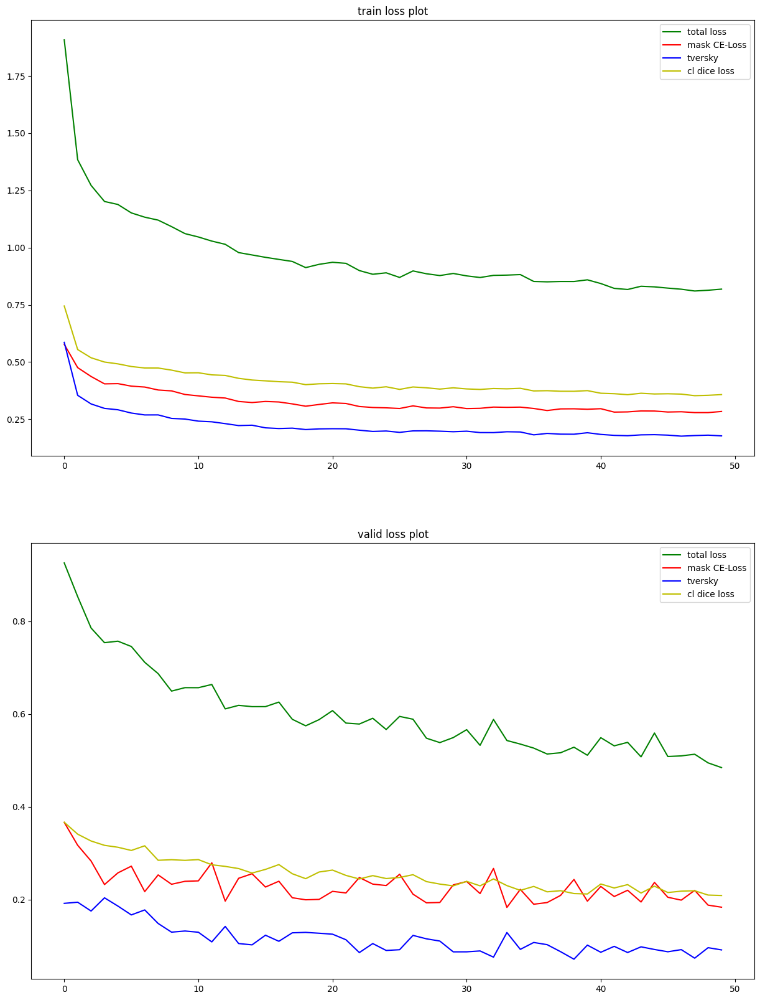

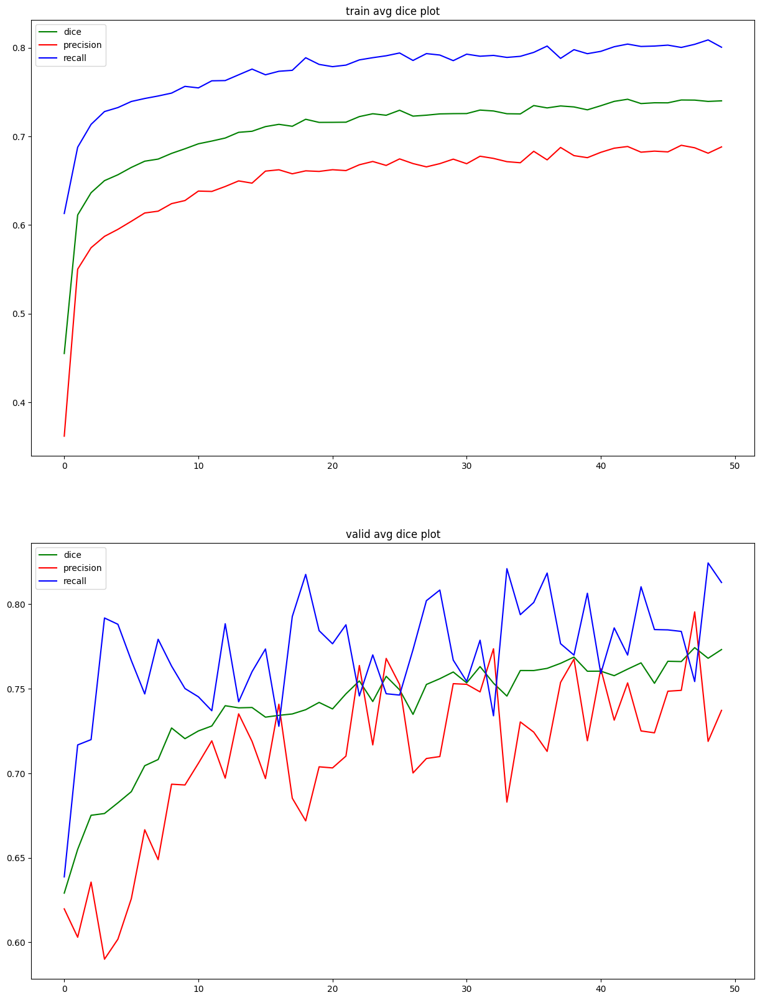

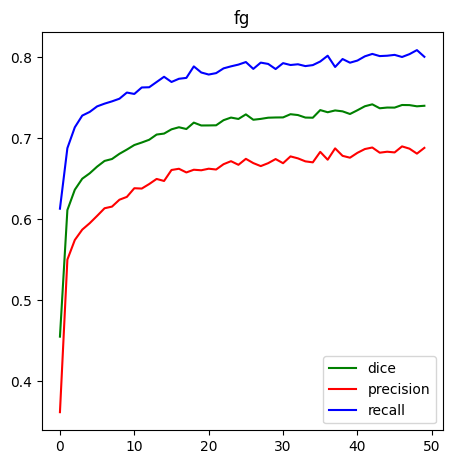

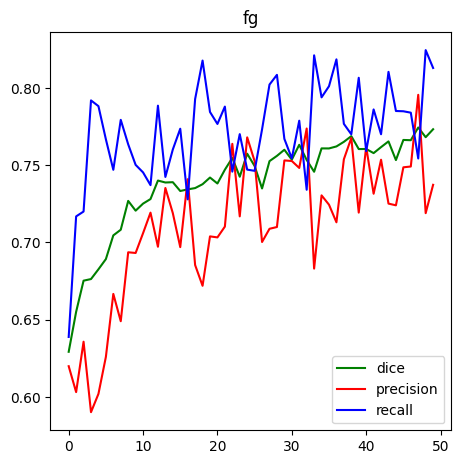

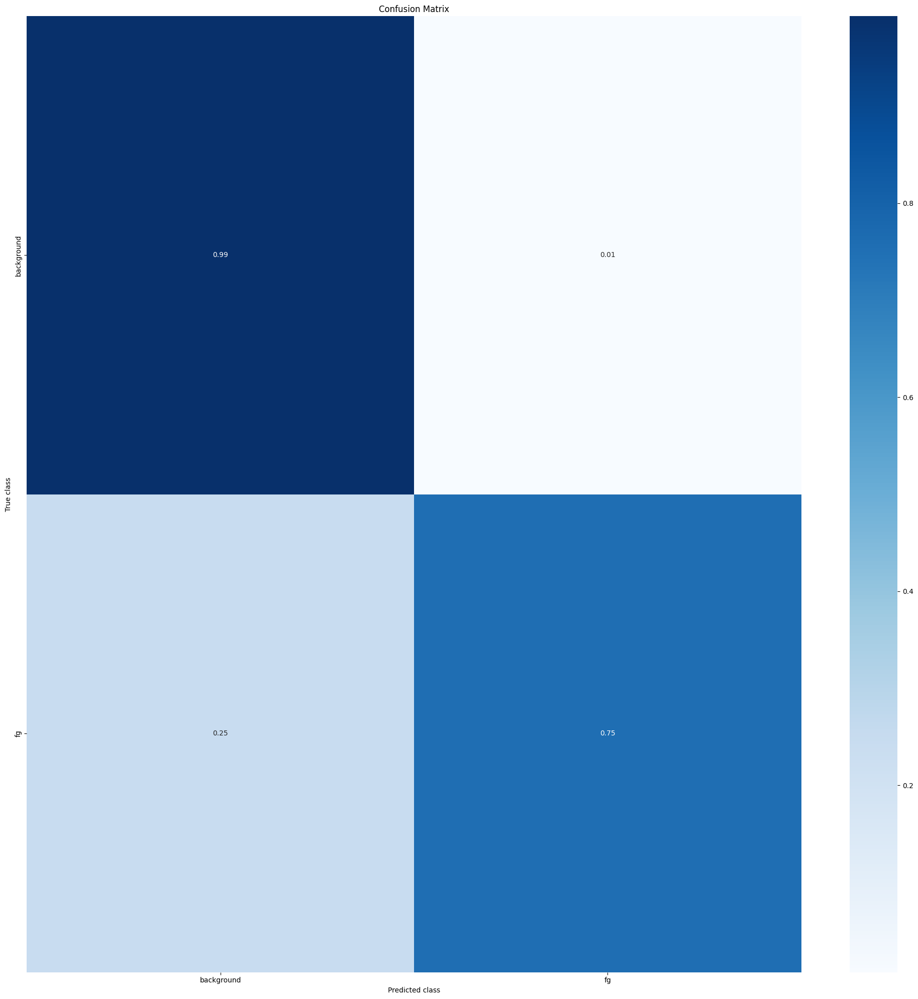

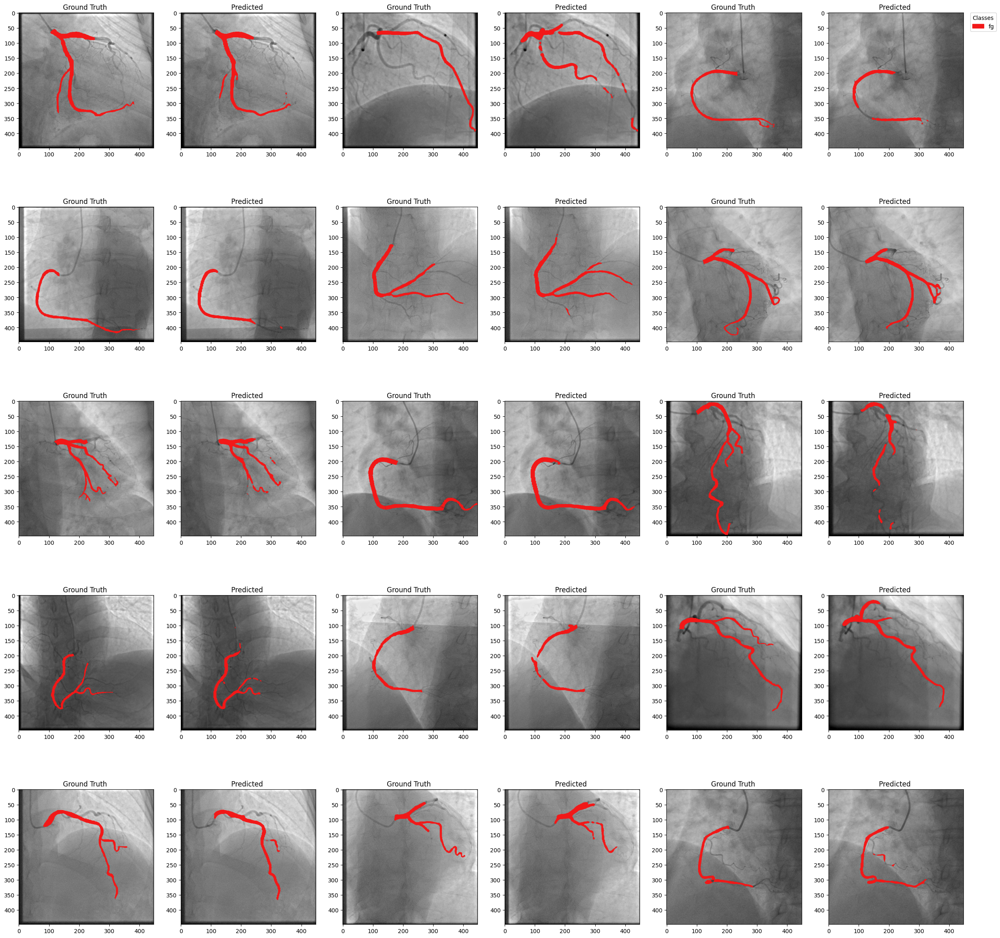

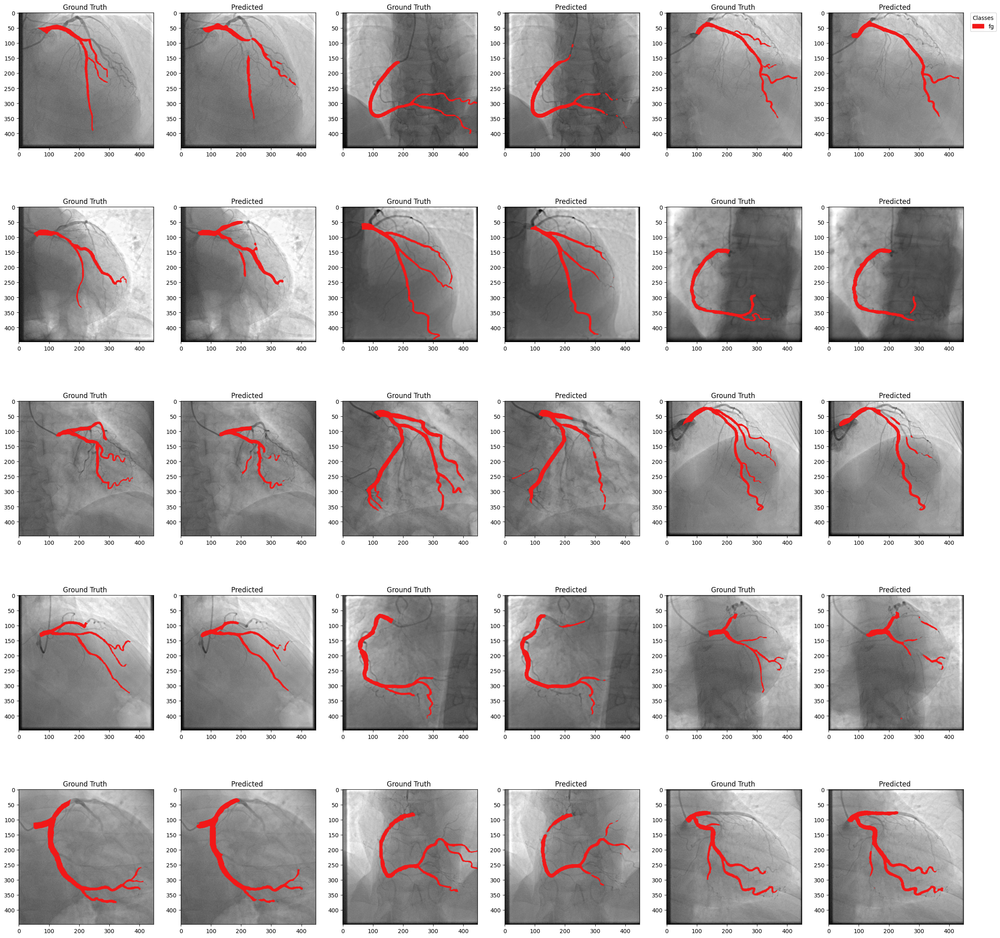

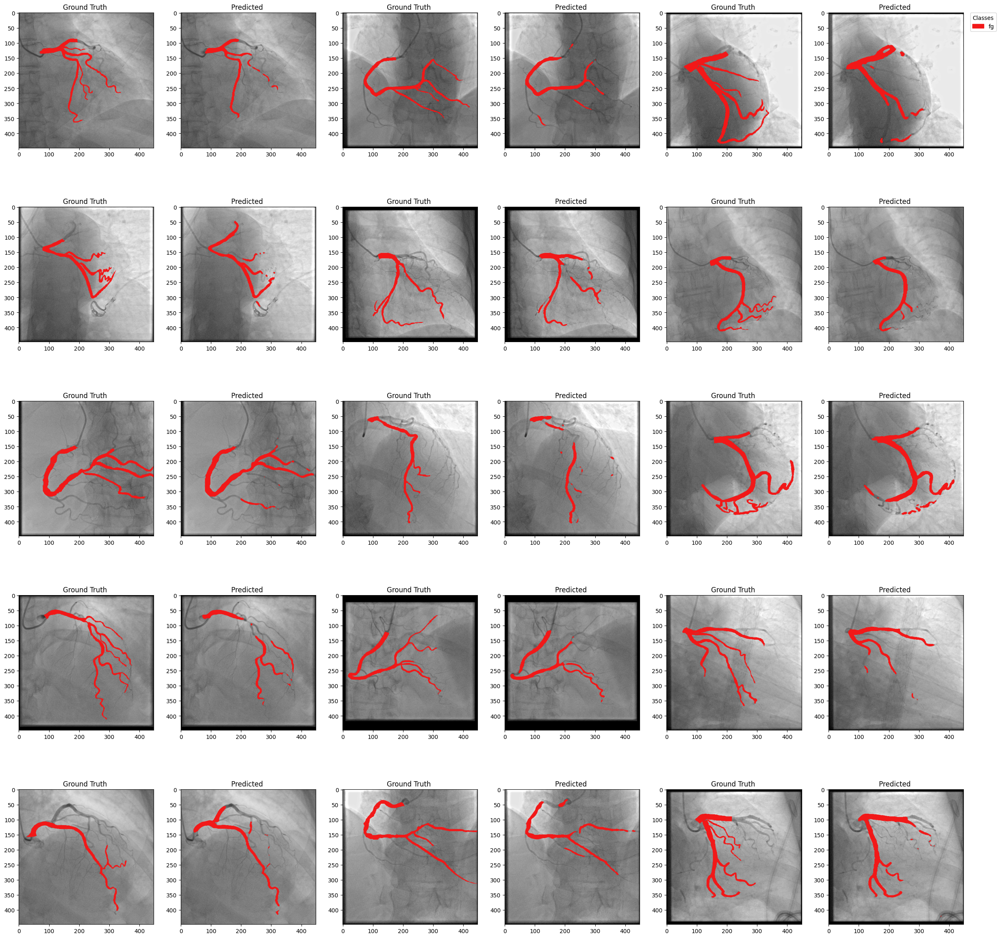

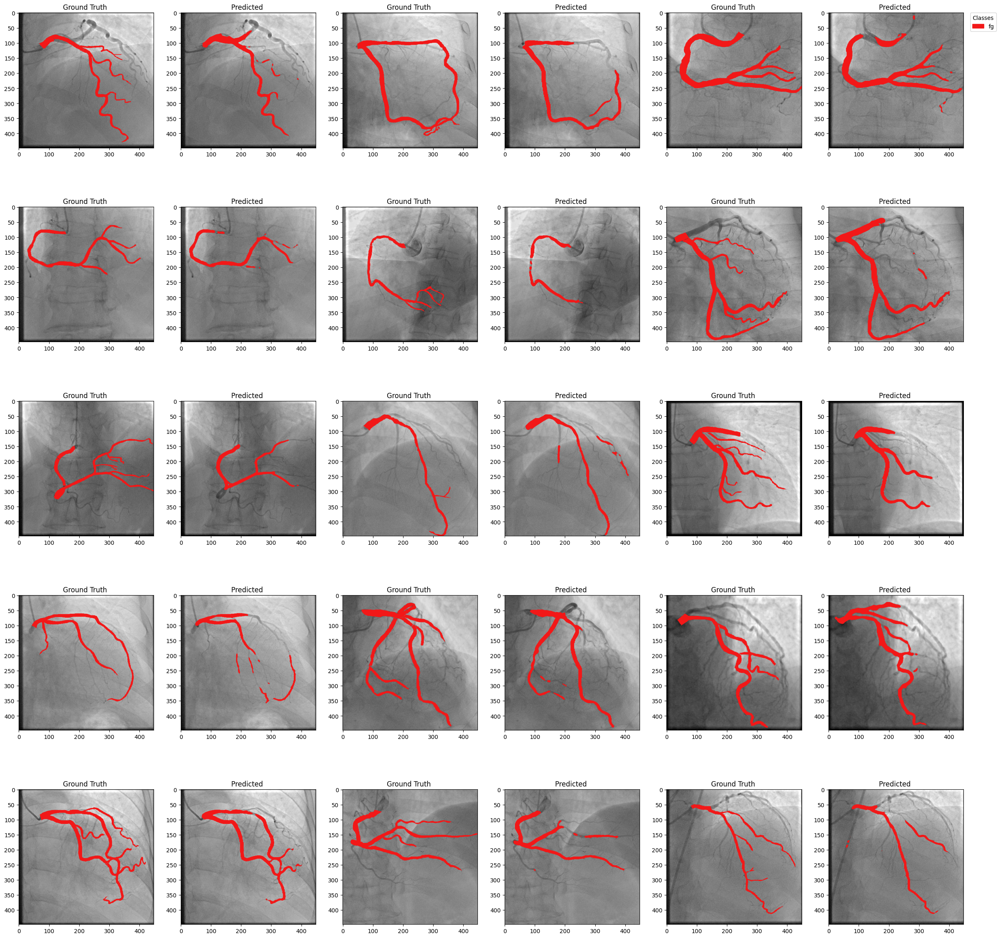

In [9]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    normalizer = normalizer,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"],
    training_mode = args["training_mode"]
)